# Final project DL4CV
# CMS4CV - Unet GAN on an extended training set

## Task:
## Historical image Recoloring and Super-Resolution


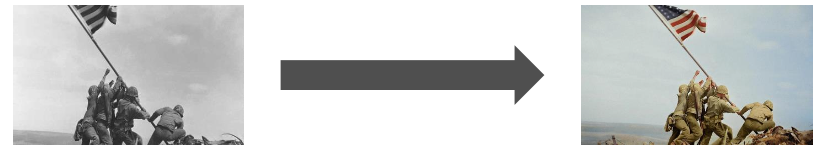

## Data:

1.   https://www.kaggle.com/datasets/hsankesara/flickr-image-dataset/data
2.   https://www.kaggle.com/datasets/rahulrwl/landscape-images/data
3.   https://www.kaggle.com/datasets/medsalimaissi/similarity-dataset (selected images for zero-shot inference: https://www.kaggle.com/datasets/pierluigimancinelli/landscape-historical-images)

## Execution:
1. Written and optimized to run on Kaggle, running on Colab requires dataset download and path adjustments
2. Trained model filename: **unet_both_data.keras**

# Imports

In [ ]:
# Set seed for reproducibility
seed = 123
import os

# Set environment variables before importing modules
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
os.environ['PYTHONHASHSEED'] = str(seed)
os.environ['MPLCONFIGDIR'] = os.getcwd() + '/configs/'

#miscellanea - Import necessary libraries
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd #SEE IF YOU CAN INSTALL MODIN
import random
from PIL import Image
from keras import backend as K
import logging
import sys
from collections import defaultdict
from tqdm import tqdm
import cv2

# Import TensorFlow and Keras
import tensorflow as tf
from tensorflow import keras as tfk
from tensorflow.keras import layers as tfkl

# Set seed for TensorFlow and Numpy
tf.random.set_seed(seed)
tf.compat.v1.set_random_seed(seed)

np.random.seed(seed)

# Reduce TensorFlow verbosity
tf.autograph.set_verbosity(0)
tf.get_logger().setLevel(logging.ERROR)
tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)

# Suppress warnings
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=Warning)

# ⏳ Load & Transform Data

*   Noise injection
*   Gaussian Blurring
*   Downscaling  
*   Gray-scale mapping

#### First dataset

In [ ]:
import kagglehub

path = kagglehub.dataset_download("hsankesara/flickr-image-dataset")

print("Path to dataset files:", path)

Path to dataset files: /kaggle/input/flickr-image-dataset


In [ ]:
image_folder = path + "/flickr30k_images/flickr30k_images/flickr30k_images/"

In [ ]:
image_df = pd.read_csv(path + "/flickr30k_images/flickr30k_images/results.csv", sep="|")

In [ ]:
# column re-naming
image_df['comment_number'] = image_df[' comment_number']
image_df['comment'] = image_df[' comment']

In [ ]:
# row filtering to keep unique image names
image_names = image_df.image_name.unique()

#### Second dataset

In [ ]:
path2 = kagglehub.dataset_download("rahulrwl/landscape-images")
print("Path to dataset files:", path2)

Path to dataset files: /kaggle/input/landscape-images


In [ ]:
folder_path = path2 + '/images'
folder_path

'/kaggle/input/landscape-images/images'

In [ ]:
import requests
import io
# ulr containing the paths to the images selected for being in the dataset, as explained in DataAppendix notebook

image_name_url = "https://github.com/fabiosacerdote/Deep-Learning-for-Image-Restoration-CMS4CV/raw/refs/heads/main/image_paths.npy"

response = requests.get(image_name_url)
response.raise_for_status()
colab_image_paths = np.load(io.BytesIO(response.content), allow_pickle=True)

In [ ]:
kaggle_image_paths = []
df_1_paths = []
df_2_paths = []

for i in tqdm(range(len(colab_image_paths))):
    parts = colab_image_paths[i].split("/")
    if parts[5] == "hsankesara":
        fixed = image_folder + parts[-1]
        df_1_paths.append(fixed)
        #continue
    else:
        fixed = folder_path + "/" + parts[-1]
        df_2_paths.append(fixed)
    kaggle_image_paths.append(fixed)


df_1_paths = np.array(df_1_paths)
df_2_paths = np.array(df_2_paths)
#image_paths = np.array(kaggle_image_paths)

100%|██████████| 37142/37142 [00:00<00:00, 846919.10it/s]


In [ ]:
how_many = 8000 # per each dataset
batch = 16
input_dimension = 128

rng = np.random.default_rng(seed)
# Shuffle the array in a reproducible way
df_1_paths = rng.permutation(df_1_paths)
df_2_paths = rng.permutation(df_2_paths)

image_paths = np.concatenate([df_1_paths[:how_many], df_2_paths[:how_many//4]])

print(f'Datasets combined to create a list of {len(image_paths)} images')

Datasets combined to create a list of 10000 images


In [ ]:
# auxiliary functions to apply grey scaling, noise and blurring
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))


def add_grain_tf(image, intensity=0.5):
    """Adds grain to an image using TensorFlow.

    Args:
        image: A TensorFlow tensor representing the image.
        intensity: The intensity of the grain (default: 0.5). This should make the images resamble historical images

    Returns:
        A TensorFlow tensor with added grain.
    """

    image = tf.cast(image, dtype=tf.float32)
    noise = tf.random.normal(tf.shape(image), mean=0.0, stddev=intensity, dtype=image.dtype)
    grainy_image = tf.add(image, noise)
    grainy_image = tf.cast(grainy_image, tf.float32)


    #noise = tf.random.normal(tf.shape(image), mean=0.0, stddev=intensity, dtype=image.dtype)
    #grainy_image = tf.add(image, noise)
    return grainy_image


def auxiliary_functions(image, intensity = 1):
  image_np = image.numpy().astype("float32")

  # Add noise
  image_np = add_grain_tf(image_np, intensity).numpy()

  # Blur image
  image_np = cv2.GaussianBlur(image_np, (5, 5), 0)

  # Downscale by a factor of 2
  height, width = image_np.shape[:2]
  image_np = cv2.resize(image_np, (input_dimension, input_dimension), interpolation=cv2.INTER_AREA)

  # Gray scaling
  image_np = cv2.cvtColor(image_np, cv2.COLOR_BGR2GRAY)

  # Histogram Equalization (CLAHE)
  image_np = clahe.apply(image_np.astype("uint8")).astype("float32")

  # Normalize
  image_np /= 255

  # Add channel dimension for TensorFlow
  image_np = image_np[..., np.newaxis]
  return tf.convert_to_tensor(image_np, dtype=tf.float32)



def auxiliary_functions_output(image):
  image_np = image.numpy()

  image_np = cv2.resize(image_np, (input_dimension*2, input_dimension*2), interpolation=cv2.INTER_AREA)

  # Add channel dimension for TensorFlow
  #image_np = image_np[..., np.newaxis]
  return tf.convert_to_tensor(image_np, dtype=tf.float32)

# Parse image with added custom effects
def parse_image(file_path, width, height, type = 'train'):
  '''
  Function to parse images, add transformations and cast them to tf.Dataset.
  Args:
    - file_path: path to the image
    - width: width of the image
    - height: height of the image
    - type: either 'train' or any other str. Used to distinguish between model inputs and predictions
  Returns:
    - image: parsed and transformed image
  '''
  # Read image
  image = tf.io.read_file(file_path)
  image = tf.image.decode_jpeg(image, channels=3)

  if type == 'train':



    # Apply auxiliary transformations (grain/noise, blur, downscale, grayscale)
    image = tf.py_function(
        auxiliary_functions,
        [image],
        Tout=tf.float32)

    # ensure the image has been correctly downsampled
    image.set_shape([input_dimension, input_dimension, 1])


  else:
    # Ensure the shape is maintained
    image = tf.py_function(
        auxiliary_functions_output,
        [image],
        Tout=tf.float32)

    image.set_shape([input_dimension*2, input_dimension*2, 3])  # 1 channel for original image

  # set image type to float32
  image = tf.cast(image, tf.float32)
  return image

### Train test split

In [ ]:
# Split percentages
train_split = 0.9  # 90% training
test_split = 0.1   # 10% testing

# Compute sizes
dataset_size = len(image_paths)
train_size = int(train_split * dataset_size)

rng = np.random.default_rng(seed+1)

# Shuffle the array in a reproducible way
image_paths = rng.permutation(image_paths)

dataset_input = tf.data.Dataset.from_tensor_slices(image_paths[:train_size])
dataset_input = dataset_input.map(lambda x: parse_image(x, input_dimension*2, input_dimension*2))
dataset_input = dataset_input.batch(batch_size = batch)

dataset = tf.data.Dataset.from_tensor_slices(image_paths[:train_size])
dataset = dataset.map(lambda x: parse_image(x, input_dimension*2, input_dimension*2, type = 'output'))
dataset = dataset.batch(batch_size = batch)


# Combine datasets into (grayscale, color) pairs
dataset_final = tf.data.Dataset.zip((dataset_input, dataset))

for grayscale, color in dataset_final.take(1):
    print(f"Grayscale Image Shape: {grayscale.shape}")
    print(f"Color Image Shape: {color.shape}")

train_dataset = dataset_final.prefetch(tf.data.AUTOTUNE)

Grayscale Image Shape: (16, 128, 128, 1)
Color Image Shape: (16, 256, 256, 3)


In [ ]:
dataset_input = tf.data.Dataset.from_tensor_slices(image_paths[train_size:])
dataset_input = dataset_input.map(lambda x: parse_image(x, input_dimension*2, input_dimension*2))
dataset_input = dataset_input.batch(batch_size = batch)

dataset = tf.data.Dataset.from_tensor_slices(image_paths[train_size:])
dataset = dataset.map(lambda x: parse_image(x, input_dimension*2, input_dimension*2, type = 'output'))
dataset = dataset.batch(batch_size = batch)



# Combine datasets into (grayscale, color) pairs
dataset_test = tf.data.Dataset.zip((dataset_input, dataset))

for grayscale, color in dataset_test.take(1):
    print(f"Grayscale Image Shape: {grayscale.shape}")
    print(f"Color Image Shape: {color.shape}")

test_dataset = dataset_test.prefetch(tf.data.AUTOTUNE)

Grayscale Image Shape: (16, 128, 128, 1)
Color Image Shape: (16, 256, 256, 3)


In [ ]:
del dataset_final, dataset_test

# Architecture: Multitask

•⁠  I⁠⁠mage reconstruction with  U-Net + GAN

•⁠  Image re-coloring with 3 channel output

•⁠  Image super-resolution adding an upscaling layer at the end

In [ ]:
input_shape = (input_dimension, input_dimension, 1)  # Grayscale input 128x128
print('Input shape',input_shape)

# OUR VANILLA UNET
def unet_block(input_tensor, filters, kernel_size=3, activation='lrelu', stack=1, name=''):

    x = input_tensor
    for i in range(stack):
        x = tfkl.Conv2D(filters, kernel_size=3, padding='same', name=name+'conv'+str(i+1))(x)
        x = tfkl.BatchNormalization(name=name+'bn'+str(i+1))(x)
        if activation != 'relu':
            x = tfkl.LeakyReLU(alpha=0.2, name=name+'activation'+str(i+1))(x)
        else:
            x = tfkl.Activation(activation, name=name+'activation'+str(i+1))(x)

    return x

def get_unet_model(input_shape=input_shape, seed=seed):
    tf.random.set_seed(seed)
    input_layer = tfkl.Input(shape=input_shape, name='input_layer')

    # First Downsampling 256x256 -> 128x128
    down_block_1 = unet_block(input_layer, 64,stack=2, name='down_block1_')
    d1 = tfkl.MaxPooling2D()(down_block_1)

    # Second Downsampling 128x128 -> 64x64
    down_block_2 = unet_block(d1, 128, stack=2, name='down_block2_')
    d2 = tfkl.MaxPooling2D()(down_block_2)

    # Third Downsampling 64x64 -> 32x32
    down_block_3 = unet_block(d2, 256,stack=2, name='down_block3_')
    d3 = tfkl.MaxPooling2D()(down_block_3)

    # Fourth Downsampling 32x32 -> 16x16
    down_block_4 = unet_block(d3, 512,stack=2, name='down_block4_')
    d4 = tfkl.MaxPooling2D()(down_block_4)

    # Fifth Downsampling 16x16 -> 8x8
    down_block_5 = unet_block(d4, 1024, stack=2, name='down_block5_')
    d5 = tfkl.MaxPooling2D()(down_block_5)

    # Bottleneck
    bottleneck = unet_block(d5, 1024, name='bottleneck')

    # First Upsampling 16x16 -> 32x32
    u0 = tfkl.UpSampling2D()(bottleneck)
    u0 = tfkl.Add(name='add0')([u0,down_block_5]) # connection with down block before bottleneck
    u0 = unet_block(u0, 512, name='up_block0_' )

    # First Upsampling 16x16 -> 32x32
    u1 = tfkl.UpSampling2D()(u0)
    u1 = tfkl.Add(name='add1')([u1,down_block_4]) # connection with 2 down blocks before bottleneck
    u1 = unet_block(u1, 256, name='up_block1_')

    # Second Upsampling 32x32 -> 64x64
    u2 = tfkl.UpSampling2D()(u1)
    u2 = tfkl.Add(name='add2')([u2,down_block_3])
    u2 = unet_block(u2, 128, name='up_block2_')

    # Third Upsampling 64x64 -> 128x128
    u3 = tfkl.UpSampling2D()(u2)
    u3 = tfkl.Add(name='add3')([u3,down_block_2])
    u3 = unet_block(u3, 64, name='up_block3_')

    # Forth Upsampling 128x128 -> 256x256
    u4 = tfkl.UpSampling2D()(u3)
    u4 = tfkl.Add(name='add4')([u4,down_block_1])
    u4 = unet_block(u4, 64, name='up_block4_')

    #SUPER RESOLUTION PART
    # Fifth Upsampling 256x256 -> 512x512
    u5 = tfkl.UpSampling2D()(u4)
    #u5 = tfkl.Add(name='add5')([u5,down_block_1]) #TODO: try
    u5 = unet_block(u5, 32, name='up_block5_')

    # Output Layer
    #NB: num_classes = 3, R G B
    output_layer = tf.keras.layers.Conv2D(3, kernel_size=3, padding='same', activation="sigmoid", name='output_layer')(u5)

    model = tf.keras.Model(inputs=input_layer, outputs=output_layer)
    return model

Input shape (128, 128, 1)


In [ ]:

def build_discriminator(input_shape=(256, 256, 3)):
    input_layer = tfkl.Input(shape=input_shape)

    x = tfkl.Conv2D(64, kernel_size=4, strides=2, padding='same')(input_layer)
    x = tfkl.LeakyReLU(alpha=0.2)(x)

    x = tfkl.Conv2D(128, kernel_size=4, strides=2, padding='same')(x)
    x = tfkl.BatchNormalization()(x)
    x = tfkl.LeakyReLU(alpha=0.2)(x)

    x = tfkl.Conv2D(256, kernel_size=4, strides=2, padding='same')(x)
    x = tfkl.BatchNormalization()(x)
    x = tfkl.LeakyReLU(alpha=0.2)(x)

    x = tfkl.Conv2D(512, kernel_size=4, strides=2, padding='same')(x)
    x = tfkl.BatchNormalization()(x)
    x = tfkl.LeakyReLU(alpha=0.2)(x)

    x = tfkl.Flatten()(x)
    x = tfkl.Dense(1, activation='sigmoid')(x)

    return tf.keras.Model(input_layer, x, name='Discriminator')


# COLORIZATION GAN

In [ ]:
# Define a GAN class inheriting from tf.keras.Model
class ColorizationGAN(tf.keras.Model):

    def __init__(self, discriminator, generator, n_discriminator_updates=3, weight_mae = 10):
      """
      Initialize the Colorization GAN.

      Args:
          discriminator: The discriminator model.
          generator: The U-Net-based generator model.
          n_discriminator_updates: Number of discriminator updates per generator update.
      """
      super(ColorizationGAN, self).__init__()
      self.discriminator = discriminator
      self.generator = generator
      self.n_discriminator_updates = n_discriminator_updates
      self.weight_mae = weight_mae

      # Initialize loss trackers
      self.d_loss_tracker = tf.keras.metrics.Mean(name="d_loss")
      self.g_loss_tracker = tf.keras.metrics.Mean(name="g_loss")
      self.val_d_loss_tracker = tf.keras.metrics.Mean(name="val_d_loss")
      self.val_g_loss_tracker = tf.keras.metrics.Mean(name="val_g_loss")



    def compile(self, d_optimizer, g_optimizer, metrics, loss_fn=None):
      """
      Compile the GAN with optimizers and loss function.
      """
      super(ColorizationGAN, self).compile()
      self.d_optimizer = d_optimizer
      self.g_optimizer = g_optimizer
      self.loss_fn = loss_fn or tf.keras.losses.BinaryCrossentropy(from_logits=True)

      self.PSNR_tracker = metrics[0]
      self.SSIM_tracker = metrics[1]


    @property
    def metrics(self):
        """
        Define GAN metrics.
        """
        return [self.d_loss_tracker, self.g_loss_tracker,
                self.val_d_loss_tracker, self.val_g_loss_tracker,
                self.PSNR_tracker, self.SSIM_tracker]


    def _generator_loss(self, fake_output, gen_output, target):
      """
      Compute generator loss combining cross entropy from discriminator
      and pixel-to-pixel mean absolute error.
      """
      gan_loss = self.loss_fn(tf.ones_like(fake_output), fake_output)
      # mean absolute error
      l1_loss = tf.reduce_mean(tf.abs(target/255. - gen_output))
      total_gen_loss = gan_loss + self.weight_mae * l1_loss
      return total_gen_loss

    def _discriminator_loss(self, real_output, fake_output):
        """
        Compute discriminator loss.
        """
        real_loss = self.loss_fn(tf.ones_like(real_output), real_output)
        fake_loss = self.loss_fn(tf.zeros_like(fake_output), fake_output)
        return real_loss + fake_loss

    @tf.function
    def train_step(self, data):
        """
        Define the training step for the GAN.
        """

        # Train discriminator multiple times
        d_loss = 0
        for _ in range(self.n_discriminator_updates):
          grayscale_images, real_color_images = data
          with tf.GradientTape() as tape:
              generated_images = self.generator(grayscale_images, training=True)
              real_output = self.discriminator(real_color_images/255., training=True)
              fake_output = self.discriminator(generated_images, training=True)
              current_d_loss = self._discriminator_loss(real_output, fake_output)

          grads = tape.gradient(current_d_loss, self.discriminator.trainable_weights)
          self.d_optimizer.apply_gradients(zip(grads, self.discriminator.trainable_weights))
          d_loss += current_d_loss / self.n_discriminator_updates

        # Train generator
        grayscale_images, real_color_images = data # PROBLEMS MAY ARISE HERE

        with tf.GradientTape() as tape:
            generated_images = self.generator(grayscale_images, training=True)
            fake_output = self.discriminator(generated_images, training=False)
            g_loss = self._generator_loss(fake_output, generated_images, target = real_color_images)

        grads = tape.gradient(g_loss, self.generator.trainable_weights)
        self.g_optimizer.apply_gradients(zip(grads, self.generator.trainable_weights))

        # Update loss trackers
        self.d_loss_tracker.update_state(d_loss)
        self.g_loss_tracker.update_state(g_loss)

        self.PSNR_tracker.update_state(real_color_images, generated_images)
        self.SSIM_tracker.update_state(real_color_images, generated_images)

        # Validation step
        self._validate_on_batch(grayscale_images, real_color_images)

        return {
            "d_loss": self.d_loss_tracker.result(),
            "g_loss": self.g_loss_tracker.result(),
            "val_d_loss": self.val_d_loss_tracker.result(),
            "val_g_loss": self.val_g_loss_tracker.result(),
            "PSNR": self.PSNR_tracker.result(),
            "SSIM": self.SSIM_tracker.result(),
        }

    def _validate_on_batch(self, grayscale_images, real_color_images):
        """
        Run validation at the end of each batch.
        """
        generated_images = self.generator(grayscale_images, training=False)
        fake_output = self.discriminator(generated_images, training=False)
        real_output = self.discriminator(real_color_images / 255.0, training=False)

        # Validation discriminator loss
        val_d_loss = self._discriminator_loss(real_output, fake_output)
        self.val_d_loss_tracker.update_state(val_d_loss)

        # Validation generator loss
        val_g_loss = self._generator_loss(fake_output, generated_images, target=real_color_images)
        self.val_g_loss_tracker.update_state(val_g_loss)

    def call(self, inputs, training=False):
        generated_images = self.generator(inputs, training=training)
        return generated_images

In [ ]:
class SSIM(tf.keras.metrics.Metric):
  def __init__(self, name="SSIM", **kwargs):
    super(SSIM, self).__init__(name=name, **kwargs)
    self.total_ssim = self.add_weight(name="total_ssim", initializer="zeros")
    self.count = self.add_weight(name="count", initializer="zeros")

  def update_state(self, y_true, y_pred, sample_weight=None):
    y_true_float = tf.image.convert_image_dtype(y_true, tf.float32)
    y_pred_float = tf.image.convert_image_dtype(y_pred, tf.float32)

    ssim_value = tf.image.ssim(y_true_float/255., y_pred_float, max_val=1.0)
    self.total_ssim.assign_add(tf.reduce_sum(ssim_value))
    self.count.assign_add(tf.cast(tf.size(ssim_value), tf.float32))

  def result(self):
    return self.total_ssim / self.count

  def reset_state(self):
    self.total_ssim.assign(0.0)
    self.count.assign(0.0)


class PSNR(tf.keras.metrics.Metric):
    def __init__(self, name="PSNR", **kwargs):
        super(PSNR, self).__init__(name=name, **kwargs)
        self.total_psnr = self.add_weight(name="total_psnr", initializer="zeros")
        self.count = self.add_weight(name="count", initializer="zeros")

    def update_state(self, y_true, y_pred, sample_weight=None):
        # Convert image dtype to float32 and normalize to [0, 1] if necessary
        y_true_float = tf.image.convert_image_dtype(y_true, tf.float32)
        y_pred_float = tf.image.convert_image_dtype(y_pred, tf.float32)

        # Calculate PSNR
        psnr_value = tf.image.psnr(y_pred_float*255, y_true_float,  max_val=255.0)

        # Update the state variables
        self.total_psnr.assign_add(tf.reduce_sum(psnr_value))
        self.count.assign_add(tf.cast(tf.size(psnr_value), tf.float32))

    def result(self):
        return self.total_psnr / self.count

    def reset_state(self):
        self.total_psnr.assign(0.0)
        self.count.assign(0.0)

from skimage import color

class MeanCIEDE2000(tf.keras.metrics.Metric):
    def __init__(self, name='mean_ciede2000', **kwargs):
        super(MeanCIEDE2000, self).__init__(name=name, **kwargs)
        self.total_ciede2000 = self.add_weight(name='total_ciede2000', initializer='zeros')
        self.count = self.add_weight(name='count', initializer='zeros')

    def update_state(self, y_true, y_pred, sample_weight=None):
        # Convert image dtype to float32 and normalize to [0, 1] if necessary
        y_true_float = tf.image.convert_image_dtype(y_true, tf.float32)
        y_pred_float = tf.image.convert_image_dtype(y_pred, tf.float32)

        def compute_ciede2000(y_true_np, y_pred_np):
            batch_ciede2000 = []
            for true_img, pred_img in zip(y_true_np, y_pred_np):
                # Convert RGB to LAB
                true_lab = color.rgb2lab(true_img)
                pred_lab = color.rgb2lab(pred_img)

                # Reshape to (num_pixels, 3)
                true_lab = true_lab.reshape(-1, 3)
                pred_lab = pred_lab.reshape(-1, 3)

                # Compute CIEDE2000 for each pixel
                ciede2000_diff = color.deltaE_ciede2000(true_lab/255., pred_lab)

                # Compute mean CIEDE2000 for the image
                mean_ciede2000 = np.mean(ciede2000_diff)
                batch_ciede2000.append(mean_ciede2000)

            batch_ciede2000 = np.array(batch_ciede2000)
            return np.sum(batch_ciede2000), len(batch_ciede2000)

        # Use tf.py_function to wrap the NumPy computation
        total_ciede2000, batch_count = tf.py_function(
            func=compute_ciede2000,
            inp=[y_true, y_pred],
            Tout=[tf.float32, tf.int32]
        )

        # Update state
        self.total_ciede2000.assign_add(total_ciede2000)
        self.count.assign_add(tf.cast(batch_count, tf.float32))

    def result(self):
        return self.total_ciede2000 / self.count

    def reset_state(self):
        self.total_ciede2000.assign(0.0)
        self.count.assign(0.0)


# Define a callback class for visualization during training
class VizCallback(tf.keras.callbacks.Callback):
  def __init__(self, image, label, interval=1):
    """
    Visualization Callback to display model predictions during training.

    Args:
        image: Input grayscale image(s) to pass through the model.
        label: Ground truth color image(s) for comparison.
        interval: Frequency (in epochs) to trigger visualization.
    """
    super().__init__()
    self.image = image
    self.label = label
    self.interval = interval

  def on_epoch_end(self, epoch,  logs=None):
    if (epoch + 1) % self.interval == 0:
      # Extract and reshape a single image from the batch
      image_data = next(iter(self.image))
      label_data = next(iter(self.label))

      pred = self.model.generator(image_data[0])
      fig, axes = plt.subplots(1, 3, figsize=(18, 6))

      # Original grayscale image
      axes[0].imshow(tf.squeeze(image_data[0][0]*255), cmap="gray")
      axes[0].set_title("Input Grayscale Image")
      axes[0].axis("off")

      # Predicted color image
        #Linear:
      #pred_clipped = tf.clip_by_value(pred[0], 0, 255)  # Ensure values are in [0, 1]
      #axes[1].imshow(tf.squeeze(pred_clipped).numpy().astype('uint8'))
        #Sigmoid:
      axes[1].imshow((tf.squeeze(pred[0]).numpy()*255).astype('uint8'))
      axes[1].set_title("Predicted Color Image")
      axes[1].axis("off")

      # Ground truth color image
      axes[2].imshow(tf.squeeze(label_data[0][0]).numpy().astype('uint8'))
      axes[2].set_title("Ground Truth Color Image")
      axes[2].axis("off")

      plt.tight_layout()
      plt.show()

# Set up a checkpoint directory
#checkpoint_dir = './checkpoints'
#checkpoint_filepath = checkpoint_dir + '/model-{epoch:02d}-{val_loss:.2f}.weights.h5'

# Create a callback for saving the model's weights
checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath='./checkpoints/best_model.weights.h5',
    save_weights_only=True,  # Save only the weights, not the full model
    monitor='g_loss',      # Monitor generator's validation loss
    mode='min',              # Save weights when 'val_loss' is minimized
    save_best_only=True)

In [ ]:
# Example image and label for visualization

example_image = dataset_input.take(2).map(lambda x: x).batch(16)
example_label = dataset.take(2).map(lambda x: x).batch(16)

# Visualization callback
viz_callback = VizCallback(example_image, example_label, interval = 2)


In [ ]:
unet_gan = ColorizationGAN(
    discriminator= build_discriminator() ,
    generator = get_unet_model(), # 128x128x1  # Using U-Net as the generator
    n_discriminator_updates=2,
    weight_mae = 200 # how much to weight MAE wrt generator loss
    )

unet_gan.compile(
    d_optimizer=tf.keras.optimizers.Adam(learning_rate=1e-5, beta_1=0.5, beta_2 = 0.999),
    g_optimizer=tf.keras.optimizers.Adam(learning_rate=1e-5, beta_1=0.5, beta_2 = 0.999),
    loss_fn=tf.keras.losses.BinaryCrossentropy(from_logits=True),
    metrics = [PSNR(), SSIM()])

In [ ]:
user_input = input("Do you want to train the model from scratch? (yes/no): ").strip().lower()
if user_input in ['yes', 'y']:
    print("Starting training from scratch...")
    # Train the GAN model on the dataset with specified parameters
    history = unet_gan.fit(
        train_dataset,
        epochs=50,
        batch_size=16,
        #validation_data=test_dataset,
        callbacks=[ viz_callback ,
                   checkpoint_callback,
                   #early_stopping,
                   #scheduler,
                   ]
    )#.history

    unet_gan.save('unet_both_data.keras')
else:
    print("Loaded existing weights")
    #unet_gan.load_weights('unet_both_data.keras')
    unet_gan.load_weights('unet_both_data_145.keras')

Do you want to train the model from scratch? (yes/no):  no


Loaded existing weights


Epoch 1/5


I0000 00:00:1733394905.320948      95 service.cc:145] XLA service 0x7add78046c00 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1733394905.321025      95 service.cc:153]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0
W0000 00:00:1733394908.099573      95 assert_op.cc:38] Ignoring Assert operator StatefulPartitionedCall/PSNR/Assert/Assert
W0000 00:00:1733394908.100639      95 assert_op.cc:38] Ignoring Assert operator StatefulPartitionedCall/PSNR/Assert_1/Assert
W0000 00:00:1733394908.100744      95 assert_op.cc:38] Ignoring Assert operator StatefulPartitionedCall/SSIM/Assert/Assert
W0000 00:00:1733394908.100836      95 assert_op.cc:38] Ignoring Assert operator StatefulPartitionedCall/SSIM/Assert_1/Assert
W0000 00:00:1733394908.101780      95 assert_op.cc:38] Ignoring Assert operator StatefulPartitionedCall/SSIM/Assert_2/Assert
W0000 00:00:1733394908.102407      95 assert_op.cc:38] Ignoring Assert operator St

562/563 ━━━━━━━━━━━━━━━━━━━━ 0s 581ms/step - PSNR: 25.1113 - SSIM: 0.8069 - d_loss: 0.0044 - g_loss: 7.8274 - val_d_loss: 6.1702 - val_g_loss: 8.8442

W0000 00:00:1733395258.318174      93 assert_op.cc:38] Ignoring Assert operator StatefulPartitionedCall/PSNR/Assert/Assert
W0000 00:00:1733395258.318386      93 assert_op.cc:38] Ignoring Assert operator StatefulPartitionedCall/PSNR/Assert_1/Assert
W0000 00:00:1733395258.318402      93 assert_op.cc:38] Ignoring Assert operator StatefulPartitionedCall/SSIM/Assert/Assert
W0000 00:00:1733395258.318413      93 assert_op.cc:38] Ignoring Assert operator StatefulPartitionedCall/SSIM/Assert_1/Assert
W0000 00:00:1733395258.318797      93 assert_op.cc:38] Ignoring Assert operator StatefulPartitionedCall/SSIM/Assert_2/Assert
W0000 00:00:1733395258.318937      93 assert_op.cc:38] Ignoring Assert operator StatefulPartitionedCall/SSIM/Assert_3/Assert


563/563 ━━━━━━━━━━━━━━━━━━━━ 395s 616ms/step - PSNR: 25.1114 - SSIM: 0.8069 - d_loss: 0.0044 - g_loss: 7.8271 - val_d_loss: 6.1703 - val_g_loss: 8.8439
Epoch 2/5
563/563 ━━━━━━━━━━━━━━━━━━━━ 0s 546ms/step - PSNR: 25.2829 - SSIM: 0.8088 - d_loss: 2.2274e-05 - g_loss: 7.4542 - val_d_loss: 5.7520 - val_g_loss: 8.4318

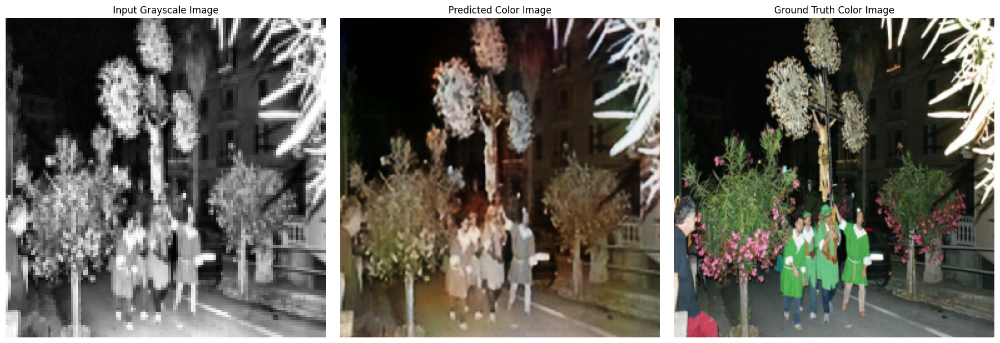

563/563 ━━━━━━━━━━━━━━━━━━━━ 313s 555ms/step - PSNR: 25.2831 - SSIM: 0.8088 - d_loss: 2.2263e-05 - g_loss: 7.4541 - val_d_loss: 5.7519 - val_g_loss: 8.4318
Epoch 3/5
563/563 ━━━━━━━━━━━━━━━━━━━━ 308s 546ms/step - PSNR: 25.3711 - SSIM: 0.8126 - d_loss: 3.9075e-06 - g_loss: 7.3353 - val_d_loss: 5.5447 - val_g_loss: 8.3532
Epoch 4/5
563/563 ━━━━━━━━━━━━━━━━━━━━ 0s 545ms/step - PSNR: 25.3483 - SSIM: 0.8136 - d_loss: 1.7916e-06 - g_loss: 7.3684 - val_d_loss: 5.5423 - val_g_loss: 8.3650

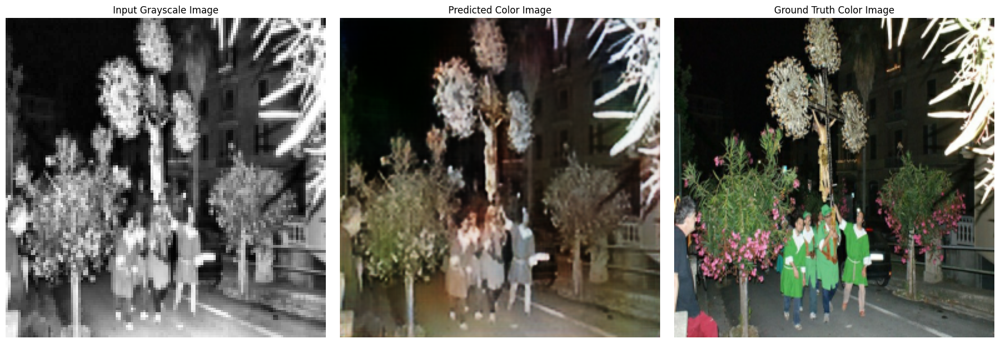

563/563 ━━━━━━━━━━━━━━━━━━━━ 309s 548ms/step - PSNR: 25.3483 - SSIM: 0.8136 - d_loss: 1.7918e-06 - g_loss: 7.3683 - val_d_loss: 5.5425 - val_g_loss: 8.3650
Epoch 5/5
563/563 ━━━━━━━━━━━━━━━━━━━━ 312s 553ms/step - PSNR: 25.3496 - SSIM: 0.8144 - d_loss: 1.1600e-06 - g_loss: 7.3712 - val_d_loss: 5.4606 - val_g_loss: 8.3799


In [ ]:
history = unet_gan.fit(
        train_dataset,
        epochs=5,
        batch_size=16,
        #validation_data=test_dataset,
        callbacks=[ viz_callback ,
                   checkpoint_callback,
                  ]
    )#.history

In [ ]:
how_many = 16

example_images = dataset_input.take(10).map(lambda x: x).batch(16)
example_labels = dataset.take(10).map(lambda x: x).batch(16)

image_data = next(iter(example_images))
label_data = next(iter(example_labels))

b = 0
pred = unet_gan.predict(image_data[b], verbose=0)

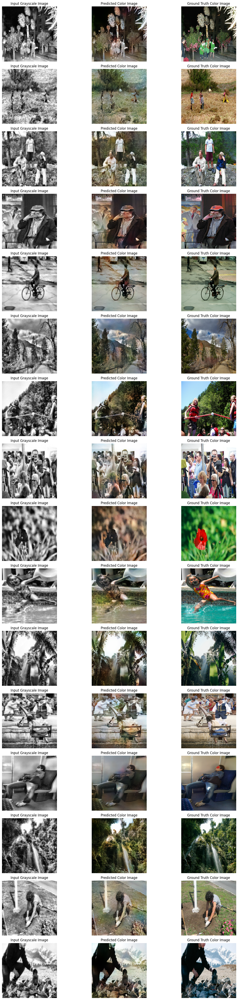

In [ ]:
fig, axes = plt.subplots(how_many, 3, figsize=(15, 50))

for i in range(how_many):

  # Original grayscale image
  axes[i][0].imshow(tf.squeeze(image_data[b][i]*255), cmap="gray")
  axes[i][0].set_title("Input Grayscale Image")
  axes[i][0].axis("off")

  # Predicted color image
    #Linear:
  #pred_clipped = tf.clip_by_value(pred[0], 0, 255)  # Ensure values are in [0, 1]
  #axes[1].imshow(tf.squeeze(pred_clipped).numpy().astype('uint8'))
    #Sigmoid:
  axes[i][1].imshow((tf.squeeze(pred[i]).numpy()*255).astype('uint8'))
  axes[i][1].set_title("Predicted Color Image")
  axes[i][1].axis("off")

  # Ground truth color image
  axes[i][2].imshow(tf.squeeze(label_data[b][i]).numpy().astype('uint8'))
  axes[i][2].set_title("Ground Truth Color Image")
  axes[i][2].axis("off")

plt.tight_layout()
plt.show()

In [ ]:
unet_gan.save('unet_both_data_150.keras')

In [ ]:
# Initialize metrics
val_PSNR_metric = PSNR()
val_SSIM_metric = SSIM()
val_MAE_metric = tf.keras.metrics.MeanAbsoluteError()
val_CIEDE2000 = MeanCIEDE2000()

# Loop through validation dataset batches
for batch in tqdm(test_dataset):
    x_batch, y_batch = batch  # Unpack features and labels
    predictions = unet_gan(x_batch, training=False)  # Get predictions

    # Update metrics
    val_PSNR_metric.update_state(y_batch, predictions)
    val_SSIM_metric.update_state(y_batch, predictions)
    val_MAE_metric.update_state(y_batch/255.0, predictions)#PSNR() and SSIM() already account for /255
    val_CIEDE2000.update_state(y_batch, predictions)

# Compute final metric results
PSNR_value = val_PSNR_metric.result().numpy()
SSIM_value = val_SSIM_metric.result().numpy()
MAE_value = val_MAE_metric.result().numpy()
CIEDE2000_value = val_CIEDE2000.result().numpy()

print(f"Validation PSNR: {PSNR_value}")
print(f"Validation SSIM: {SSIM_value}")
print(f"Validation MAE: {MAE_value}")
print(f"Validation CIEDE2000: {CIEDE2000_value}")

100%|██████████| 63/63 [00:40<00:00,  1.56it/s]

Validation PSNR: 20.244409561157227
Validation SSIM: 0.7797226309776306
Validation MAE: 0.0730217769742012
Validation CIEDE2000: 25.454383850097656


# ZERO SHOT - Historical Images

Import external images to try a zero shot inference on historical images. This dataset includes images from war scenes, cities and landscapes.

In [ ]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("medsalimaissi/similarity-dataset")

print("Path to dataset files:", path)

image_filepaths = []

for folder in os.listdir(path):
  if folder == 'bbest20':
    continue

  for subfolder in os.listdir(os.path.join(path, folder)):
    for file in os.listdir(os.path.join(path, folder, subfolder)):
      for img in os.listdir(os.path.join(path, folder, subfolder, file)):
        image_filepaths.append(os.path.join(path, folder, subfolder, file, img))

print("Number of inference images gathered:", len(image_filepaths))

# auxiliary functions to apply prepare image to be fed into the model for inference

def auxiliary_functions_output(image, intensity = 1):
  image_np = image.numpy()
  image_np = cv2.resize(image_np, (128, 128), interpolation=cv2.INTER_AREA) # not needed for U-Net

  # Histogram Equalization (CLAHE)
  image_np = clahe.apply(image_np.astype("uint8")).astype("float32")

  # Normalize
  image_np /= 255
  # Add channel dimension for TensorFlow
  image_np = image_np[..., np.newaxis]
  return tf.convert_to_tensor(image_np, dtype=tf.float32)

# Parse image with added custom effects
def parse_inference_image(file_path, width, height):
  '''
  Function to parse images, add transformations and cast them to tf.Dataset.
  Args:
    - file_path: path to the image
    - width: width of the image
    - height: height of the image
    - type: either 'train' or any other str. Used to distinguish between model inputs and predictions
  Returns:
    - image: parsed and transformed image
  '''
  # Read image
  image = tf.io.read_file(file_path)
  image = tf.image.decode_jpeg(image, channels=1)

  # Apply
  image = tf.py_function(
      auxiliary_functions_output,
      [image],
      Tout=tf.float32)

  image.set_shape([128, 128, 1])

  # set image type to uint8
  image = tf.cast(image, tf.float32)
  return image

Path to dataset files: /kaggle/input/similarity-dataset
Number of inference images gathered: 3325


Here we created manually a label to select landscape-related images only.

In [ ]:
# Download latest version
path = kagglehub.dataset_download("pierluigimancinelli/landscape-historical-images")

print("Path to dataset files:", path)

csv_path = path + '/image_classification_labels.csv'
landscapes = pd.read_csv(csv_path )

def change_path(path):
    '''
    Function to align the paths from the imported dataset to the historical images ones
    '''
    x = path.split('/')
    x = x[9:]
    x = '/'.join(x)
    x = '/kaggle/input/similarity-dataset/' + x
    return x


landscapes.image_path = landscapes.image_path.apply(lambda x: change_path(x) )
landscapes = landscapes[landscapes.label == 1].image_path # get only images of landscapes
landscapes = landscapes.sample(frac=1, ignore_index=True, random_state = 123)
landscapes = np.array(landscapes)

Path to dataset files: /kaggle/input/landscape-historical-images


In [ ]:
image_filepaths = np.array(image_filepaths)

lendscape = np.intersect1d(image_filepaths, landscapes)
american_flag = "/kaggle/input/landscape-historical-images/american_flag.jpg"
lendscape = np.insert(lendscape, 0, american_flag)
subjects = np.setdiff1d(image_filepaths, landscapes)[:240:6]

In [ ]:
batch = 16
images = np.concatenate((lendscape, subjects)) #get both some lendscapes and some subjects
dataset_hist = tf.data.Dataset.from_tensor_slices(images)
dataset_hist = dataset_hist.map(lambda x: parse_inference_image(x, 128, 128))
dataset_hist = dataset_hist.batch(batch_size=batch)

print(f"Number of inference images gathered: {len(images)}")
print(f"Dataset prepared with batch size: {batch}")

Number of inference images gathered: 196
Dataset prepared with batch size: 16


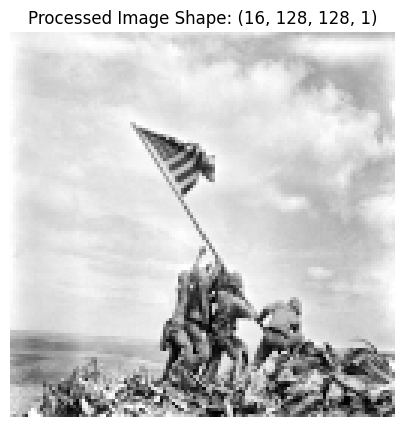

In [ ]:
for batch_images in dataset_hist.take(1):
    processed_image = batch_images.numpy()

    plt.figure(figsize=(5, 5))
    plt.imshow(tf.squeeze(processed_image[0]*255), cmap='gray')
    plt.title(f"Processed Image Shape: {processed_image.shape}")
    plt.axis('off')
    plt.show()

In [ ]:
example_images = dataset_hist.take(10).map(lambda x: x).batch(16)

image_data = next(iter(example_images))

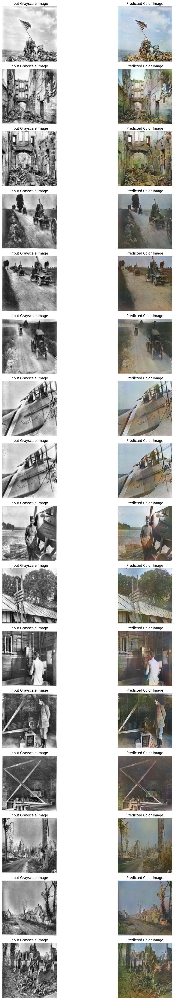

In [ ]:
b = 0# selected batch

pred = unet_gan.predict(image_data[b], verbose=0)

fig, axes = plt.subplots(how_many,2,  figsize=(15, 50))

for i in range(how_many):

  # Original grayscale image
  axes[i][0].imshow(tf.squeeze(image_data[b][i]*255), cmap="gray")
  axes[i][0].set_title("Input Grayscale Image")
  axes[i][0].axis("off")

  # Predicted color image
  axes[i][1].imshow((tf.squeeze(pred[i]).numpy()*255).astype('uint8'))
  axes[i][1].set_title("Predicted Color Image")
  axes[i][1].axis("off")

plt.tight_layout()
plt.show()